In [1]:

import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse 
import numpy as np
import pandas as pd
from pandas.plotting import scatter_matrix as sm
from scipy.spatial.distance import cdist
import seaborn as sns
from sklearn import preprocessing
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.metrics.cluster import adjusted_rand_score


In this project, we will take use some self-defined functions to plot the 2-D K-Means.

# Import Data
In this project, we use [Wine Dataset](http://archive.ics.uci.edu/ml/datasets/Wine) to cluster different types of wines. This data set contains the results of a chemical analysis of wines grown in a specific area of Italy.

The attributes are (dontated by Riccardo Leardi, riclea@anchem.unige.it ):
1. Alcohol
2. Malic acid
3. Ash
4. Alcalinity of ash  
5. Magnesium
6. Total phenols
7. Flavanoids
8. Nonflavanoid phenols
9. Proanthocyanins
10. Color intensity
11. Hue
12. OD280/OD315 of diluted wines
13. Proline 

Variable `Label` include the true labels of different wine.

In [2]:
wine = pd.read_csv('wine.data(1).csv')
print(wine['Label'].unique())
wine.head()


[1 2 3]


,Label,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [3]:
# True labels
label = wine['Label']
del wine['Label']


In [4]:
label

0      1
1      1
2      1
3      1
4      1
      ..
173    3
174    3
175    3
176    3
177    3
Name: Label, Length: 178, dtype: int64

In [5]:
# Data description
print("Types of variables:\n",wine.dtypes)
wine.describe()

Types of variables:
 Alcohol                 float64
Malic acid              float64
Ash                     float64
Alcalinity of ash       float64
Magnesium                 int64
Total phenols           float64
Flavanoids              float64
Nonflavanoid phenols    float64
Proanthocyanins         float64
Color intensity         float64
Hue                     float64
OD280                   float64
Proline                   int64
dtype: object


,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


From the table above we can get that there are 178 instances of wine and 13 attributes and for each attribute, the distribution differ a lot. Then we are going to plot the scatter plot of the dataset `wine` as follow:

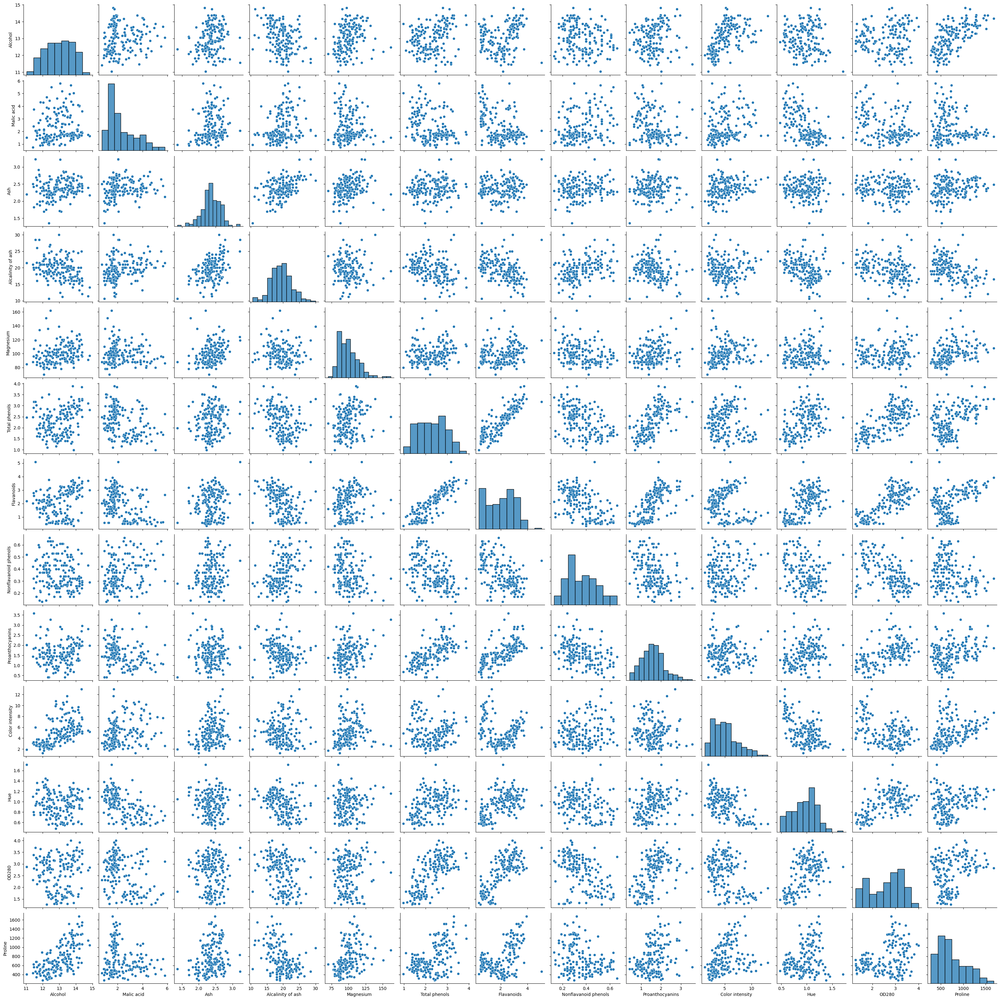

In [6]:
# Scatter plot
sns.pairplot(wine)
plt.show()

From the scatter plot, it's hard for us to cluster the data.

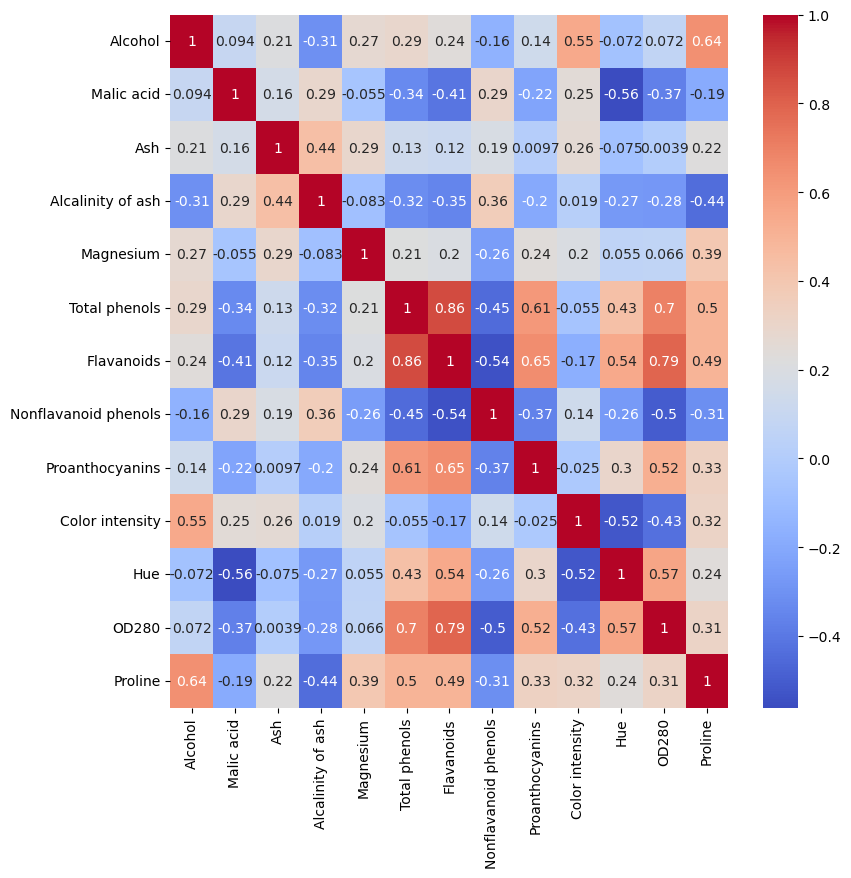

In [7]:
# Correlation Heatmap
correlation = wine.corr()
plt.subplots(figsize = (9,9))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.show()

From the heatmap above, we can conclude that the correlation between

* "Flavanoids" and "Total phenols" (`0.86`);
* "OD280" and "Flavanoids" (`0.79`);
* "OD280" and "Total phenols" (`0.7`);

are large.

Then we can plot the regression of "Flavanoids" on "Total phenols" as follow:

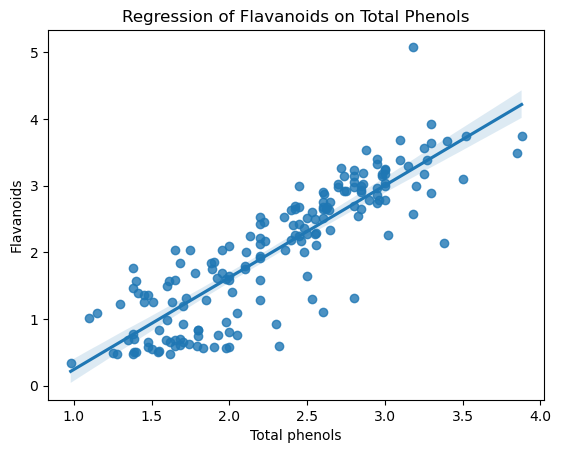

In [8]:
sns.regplot(x='Total phenols', y='Flavanoids', data=wine)
plt.title('Regression of Flavanoids on Total Phenols')
plt.show()

# [K-Means Clustering](https://en.wikipedia.org/wiki/K-means_clustering)


In [9]:
!pip show seaborn
!pip show matplotlib

Name: seaborn
Version: 0.11.2
Summary: seaborn: statistical data visualization
Home-page: https://seaborn.pydata.org
Author: Michael Waskom
Author-email: mwaskom@gmail.com
License: BSD (3-clause)
Location: f:\anaconda3\lib\site-packages
Requires: matplotlib, numpy, pandas, scipy
Required-by: 
Name: matplotlib
Version: 3.5.2
Summary: Python plotting package
Home-page: https://matplotlib.org
Author: John D. Hunter, Michael Droettboom
Author-email: matplotlib-users@python.org
License: PSF
Location: f:\anaconda3\lib\site-packages
Requires: cycler, fonttools, kiwisolver, numpy, packaging, pillow, pyparsing, python-dateutil
Required-by: seaborn


## K-Means

Something wrong!

In [10]:
kMeansClustering = KMeans(n_clusters = 3, random_state=0)


label_pred_KM = kMeansClustering.fit_predict(wine)
label_pred_KM = np.add(label_pred_KM, 1)
print("Labels predicted by K-Means:",label_pred_KM)
print('Length of labels is same as data entry', label_pred_KM.shape)

centroids_KM = kMeansClustering.cluster_centers_
print("Shape of centroids_KM",centroids_KM.shape)
print("Centroids:",centroids_KM)

inertia_KM = kMeansClustering.inertia_
print("Inertia:",inertia_KM)

Labels predicted by K-Means: [2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 2 2 1 1 2 2 1 2 2 2 2 2 2 1 1
 2 2 1 1 2 2 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 1 3 1 3 3 1 3 3 1 1 1 3 3 2
 1 3 3 3 1 3 3 1 1 3 3 3 3 3 1 1 3 3 3 3 3 1 1 3 1 3 1 3 3 3 1 3 3 3 3 1 3
 3 1 3 3 3 3 3 3 3 1 3 3 3 3 3 3 3 3 3 1 3 3 1 1 1 1 3 3 3 1 1 3 3 1 1 3 1
 1 3 3 3 3 1 1 1 3 1 1 1 3 1 3 1 1 3 1 1 1 1 3 3 1 1 1 1 1 3]
Length of labels is same as data entry (178,)
Shape of centroids_KM (3, 13)
Centroids: [[1.29298387e+01 2.50403226e+00 2.40806452e+00 1.98903226e+01
  1.03596774e+02 2.11112903e+00 1.58403226e+00 3.88387097e-01
  1.50338710e+00 5.65032258e+00 8.83967742e-01 2.36548387e+00
  7.28338710e+02]
 [1.38044681e+01 1.88340426e+00 2.42617021e+00 1.70234043e+01
  1.05510638e+02 2.86723404e+00 3.01425532e+00 2.85319149e-01
  1.91042553e+00 5.70255319e+00 1.07829787e+00 3.11404255e+00
  1.19514894e+03]
 [1.25166667e+01 2.49420290e+00 2.28855072e+00 2.08231884e+01
  9.23478261e+01 2.07072464e+00 1.75840580e+00 3.901



label_pred_KM = ...
print("Labels predicted by K-Means:",label_pred_KM)
print('Length of labels is same as data entry', label_pred_KM.shape)

centroids_KM= KM...
print("Shape of centroids_KM",centroids_KM.shape)
print("Centroids:",centroids_KM)

inertia_KM = KM...
print("Inertia:",inertia_KM)


In [11]:
wine

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


We can plot the pairwise relationships of `winenorm` with the colored label predicted bt K-Means method.

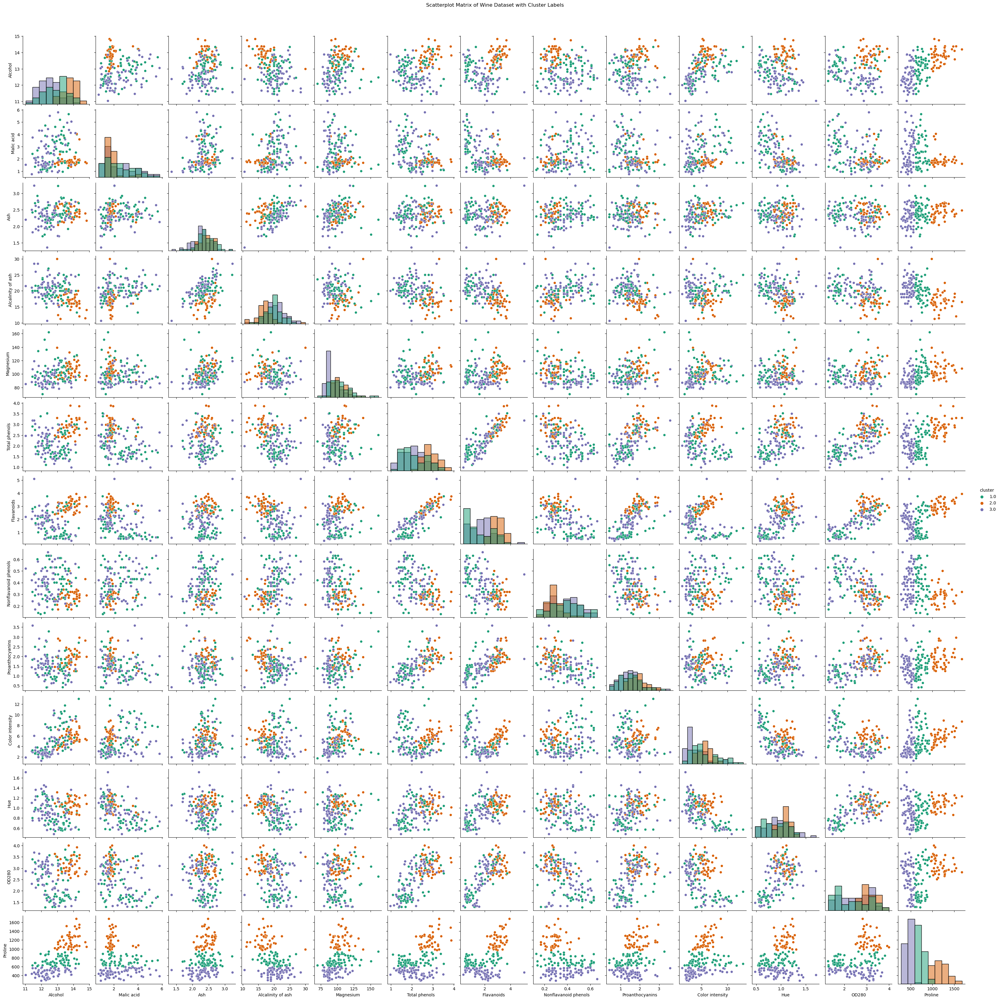

In [12]:
wine ["cluster"] = label_pred_KM.astype('float64')

sns_plot = sns.pairplot(wine, hue="cluster", diag_kind="hist",palette='Dark2')
sns_plot.fig.suptitle("Scatterplot Matrix of Wine Dataset with Cluster Labels", y=1.02)
plt.show() #doesn't show cluster column

In [13]:
wine.head()

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline,cluster
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,2.0
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,2.0
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,2.0
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,2.0
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1.0


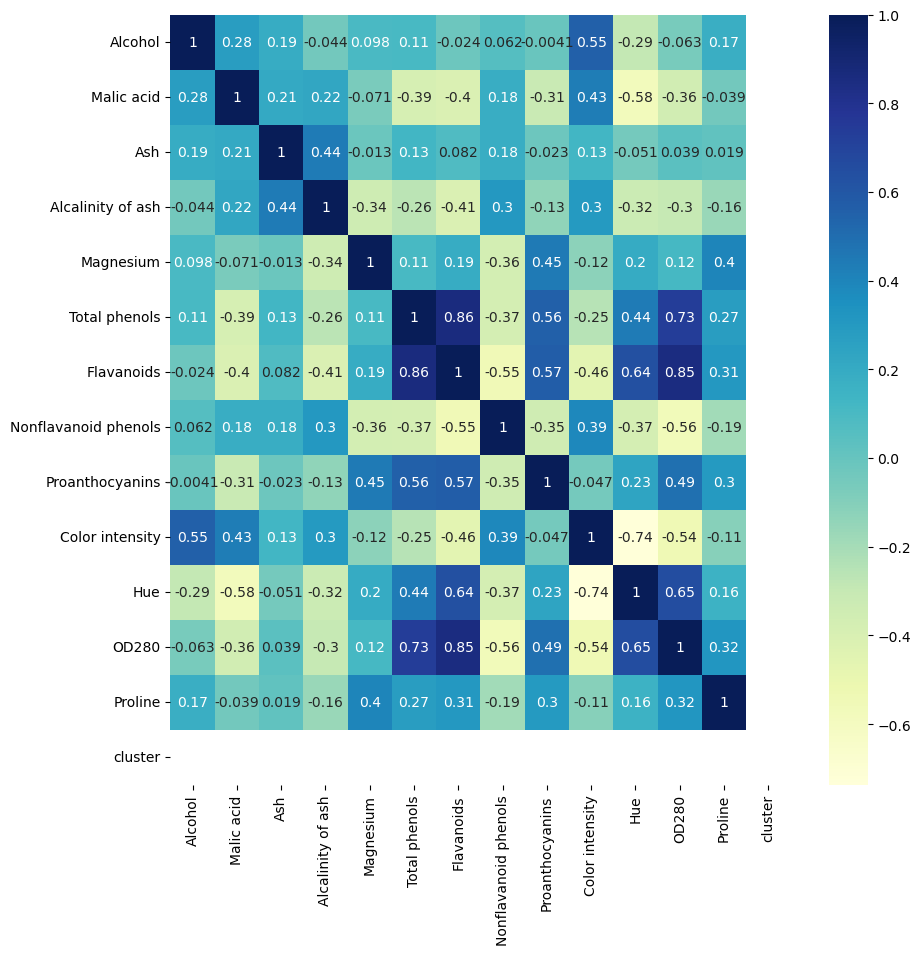

In [14]:
#Visualize the correlation matrix for alcohols in cluster 1
cluster_1 = wine[wine["cluster"] == 1]
plt.figure(figsize=(10,10))
corr_matrix = cluster_1.corr()

# Create a heatmap of the correlation matrix
sns.heatmap(corr_matrix, annot=True,cmap="YlGnBu")

plt.show()

Normalize data by removing the mean and scaling to unit variance using 
`preprocessing.StandardScaler` and do kMeans again

In [15]:
standardScaler = preprocessing.StandardScaler()
standardScaler.fit(wine)
X_scaled_array = standardScaler.transform(wine)
normalizedData = pd.DataFrame(X_scaled_array, columns = wine.columns)

In [16]:
normalizedData

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline,cluster
0,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009,-0.045889
1,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242,-0.045889
2,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148,-0.045889
3,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574,-0.045889
4,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874,-1.212782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,0.876275,2.974543,0.305159,0.301803,-0.332922,-0.985614,-1.424900,1.274310,-0.930179,1.142811,-1.392758,-1.231206,-0.021952,-1.212782
174,0.493343,1.412609,0.414820,1.052516,0.158572,-0.793334,-1.284344,0.549108,-0.316950,0.969783,-1.129518,-1.485445,0.009893,-1.212782
175,0.332758,1.744744,-0.389355,0.151661,1.422412,-1.129824,-1.344582,0.549108,-0.422075,2.224236,-1.612125,-1.485445,0.280575,-1.212782
176,0.209232,0.227694,0.012732,0.151661,1.422412,-1.033684,-1.354622,1.354888,-0.229346,1.834923,-1.568252,-1.400699,0.296498,-1.212782


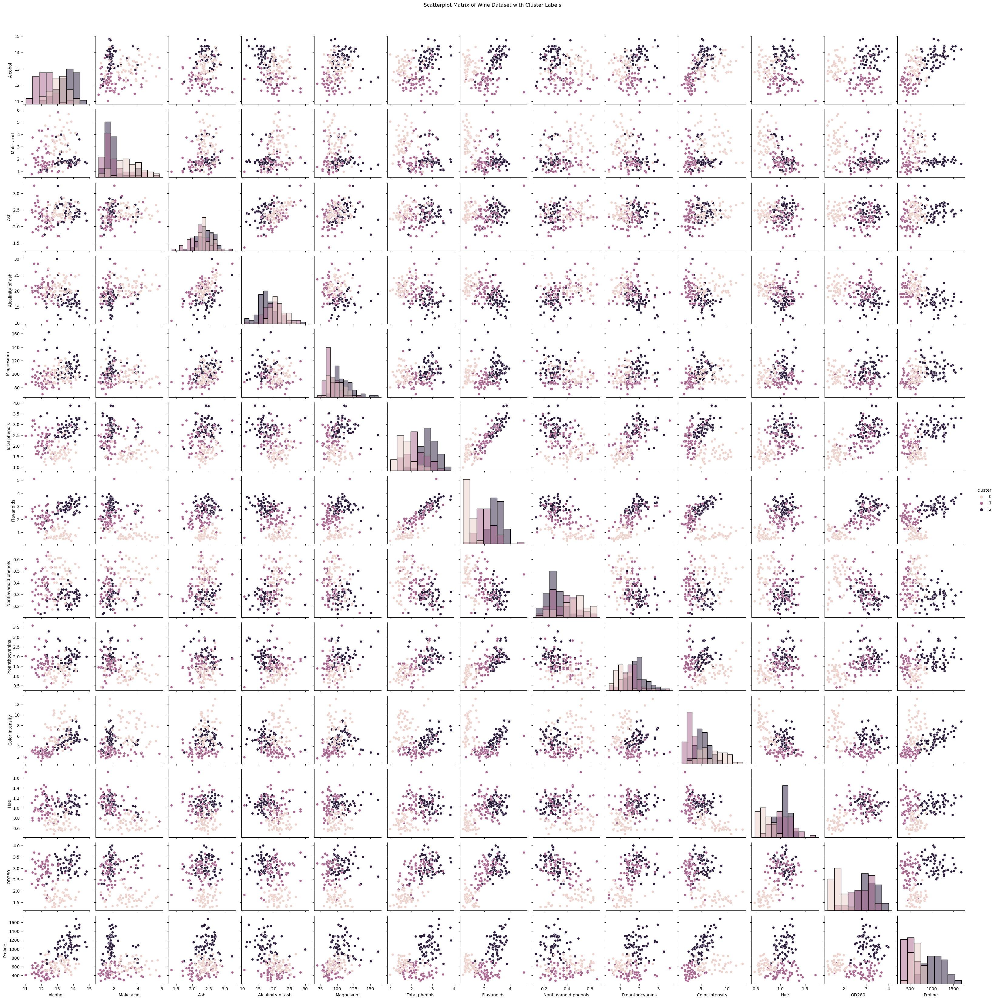

In [17]:

kMeansClustering = KMeans(n_clusters=3, random_state=0)
#k-mean dependant on normalizedData
label_pred_Nor = kMeansClustering.fit_predict(normalizedData)

# add the predicted labels to the original wine dataframe
wine["cluster"] = label_pred_Nor

# visualize the clusters using pairplot
sns_plot = sns.pairplot(wine, hue="cluster", diag_kind="hist")
sns_plot.fig.suptitle("Scatterplot Matrix of Wine Dataset with Cluster Labels", y=1.02)
plt.show()

(OPTIONAL) By using explained_variance_ratio_ attribute, we know that first 6 PCs 
explain 85.1% of variance if we reduce the dimension using PCA. You need to apply 
PCA with 6 components for the above normalized data. Then applying kMeans (3 
clusters) to cluster the data after dimensionality reduction.

In [22]:

# normalize the data
standardScaler = preprocessing.StandardScaler()
winenorm = standardScaler.fit_transform(wine)

# perform PCA with 6 components
pca = PCA(n_components=6)
wine_pca = pca.fit_transform(winenorm)
explained_variance = pca.explained_variance_ratio_
print(f"Explained variance ratio of the first 6 principal components: {explained_variance}")

# perform KMeans clustering with 3 clusters on the PCA-transformed data
kmeans = KMeans(n_clusters=3)
label_pred_pca = kmeans.fit_predict(wine_pca)

# add the cluster labels to the PCA-transformed data
wine_pca = pd.DataFrame(data=wine_pca, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'])
wine_pca['cluster'] = label_pred_pca.astype('float64')

# plot the pairwise relationships of the PCA-transformed data with the colored cluster labels
sns_plot = sns.pairplot(wine_pca, hue="cluster", diag_kind="hist")
sns_plot.fig.suptitle("Pairwise Relationships of Wine Dataset with Colored Labels Predicted by KMeans with PCA", y=1.02)


Explained variance ratio of the first 6 principal components: [0.39778504 0.17840031 0.10331204 0.06606344 0.06108857 0.04712951]


Text(0.5, 1.02, 'Pairwise Relationships of Wine Dataset with Colored Labels Predicted by KMeans with PCA')

In [ ]:
sns_plot = sns.pairplot(wine_pca, hue="cluster", diag_kind="hist")
sns_plot.fig.suptitle("Pairwise Relationships of Wine Dataset with Colored Labels Predicted by KMeans with PCA", y=1.02)
plt.show()

(OPTIONAL) Use adjusted_rand_score in sklearn.metrics.cluster to calculate the scores 
of original kMeans and kMeans after PCA. What is your conclusion? 
Hint:

In [24]:
# ARI for original kMeans
ari_orig = adjusted_rand_score(label, label_pred_KM)

# ARI for kMeans after PCA
ari_pca = adjusted_rand_score(label, label_pred_pca)

In [25]:

ari_pca

0.8617967592137037

In [26]:
ari_orig

0.37111371823084754

The adjusted Rand Index (ARI) is a measure of the similarity between two clusterings. It takes into account all pairs of samples and measures the agreement between the two clusterings, with a value of 1 indicating a perfect match.

In this case, we calculated the ARI for the original kMeans clustering and the kMeans clustering after PCA. The ARI score for the kMeans clustering after PCA is 0.8617967592137037, which is much higher than the ARI score for the original kMeans clustering, which is 0.37111371823084754.

This suggests that the kMeans clustering after PCA provides a better clustering of the wine dataset, as it produces more similar clusterings to the true labels compared to the original kMeans clustering. Therefore, dimensionality reduction using PCA can be a useful preprocessing step to improve the performance of clustering algorithms on high-dimensional datasets.